<a href="https://colab.research.google.com/github/marquesgabi/mineracao_trabalho_final/blob/main/Gabi_MDC16_Trabalho_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install PyDrive &> /dev/null

In [ ]:
import os
import json
import tarfile
import numpy as np
import tensorflow as tf
from sklearn.utils import class_weight
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
import pandas as pd

from google.colab import auth
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from oauth2client.client import GoogleCredentials

import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
# TODO: verificar se dá para fazer a leitura no google drive de um jeito só sem usar drive2 (pydrive) e drive (googledrive)
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive2 = GoogleDrive(gauth)

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Download e extração das imagens

In [ ]:
downloaded = drive2.CreateFile({'id':'1VlqmRSaYQnDVvA-0ud7is7gN08TLdiTw'})
downloaded.GetContentFile('UTKFace.tar')

tar = tarfile.open('UTKFace.tar')
tar.extractall()
tar.close()

In [ ]:
!ls -1 UTKFace | wc -l

23708


Leitura dos CSVs de treino/validação/teste

In [ ]:
# Add a link to your drive: https://drive.google.com/drive/folders/1vTtJ_EPDM_NXGufNbUHt8-6SPvlz9r_9
base_dir = '/content/drive/MyDrive/Análise de Características Faciais'
base_dir_images = 'UTKFace'

df_train = pd.read_csv(f'{base_dir}/train-utkface.csv')
df_val = pd.read_csv(f'{base_dir}/valid-utkface.csv')
df_test = pd.read_csv(f'{base_dir}/test-utkface.csv')

In [ ]:
print(f'Train: {df_train.shape}')
print(f'Val: {df_val.shape}')
print(f'Test: {df_test.shape}')

Train: (15172, 3)
Val: (3794, 3)
Test: (4742, 3)


In [ ]:
def add_labels_columns(df):
  df['parts'] = df['filename'].apply(lambda x: x.split('_'))
  df['gender'] = df['parts'].apply(lambda x: int(x[1]))
  df['race'] = df['parts'].apply(lambda x: int(x[2]) if len(x) > 3 else -1)  # default value if race is missing

  df = df[['age', 'gender', 'race', 'filename']]

  return df

In [ ]:
df_train = add_labels_columns(df_train)
df_val = add_labels_columns(df_val)
df_test = add_labels_columns(df_test)

In [ ]:
def check_missing_values(df, name):
  mask = (df['age'] == -1) | (df['gender'] == -1) | (df['race'] == -1)
  percentage = (mask.sum() / len(df)) * 100
  print(f"A porcentagem de labels ausentes em {name} é: {percentage}%")
  if percentage > 0:
    print(f"Os arquivos com labels ausentes em {name} são:")
    print(df.loc[mask, 'filename'])

check_missing_values(df_train, "treino")
check_missing_values(df_val, "validação")
check_missing_values(df_test, "teste")

A porcentagem de labels ausentes em treino é: 0.0%
A porcentagem de labels ausentes em validação é: 0.0%
A porcentagem de labels ausentes em teste é: 0.0%


In [ ]:
def check_missing_image_files(df):
  missing_files = []

  for index, row in df.iterrows():
      file_path = os.path.join(base_dir_images, row['filename'])
      if not os.path.exists(file_path):
          missing_files.append(row['filename'])
  return missing_files

In [ ]:
missing_files_train = check_missing_image_files(df_train)
missing_files_val = check_missing_image_files(df_val)
missing_files_test = check_missing_image_files(df_test)

In [ ]:
missing_files_train

['61_1_1_20170109142408075.jpg.chip.jpg',
 '61_1_3_20170109150557335.jpg.chip.jpg']

In [ ]:
missing_files_val

['39_0_1_20170116174525125.jpg.chip.jpg']

In [ ]:
# Remove invalid files from df_val
df_val = df_val[~df_val['filename'].isin(missing_files_val)]

In [ ]:
# Raça
print('Base de treino')
total_samples = len(df_train['race'])
race_counts = np.bincount(df_train['race'])
race_percentages = (race_counts / total_samples) * 100
for race, percentage in enumerate(race_percentages):
    print(f'Raça {race}: {percentage:.2f}%')

Base de treino
Raça 0: 42.83%
Raça 1: 18.79%
Raça 2: 14.48%
Raça 3: 16.61%
Raça 4: 7.29%


In [ ]:
# Genero
print('Base de treino')
total_samples = len(df_train['gender'])
gender_counts = np.bincount(df_train['gender'])
gender_percentages = (gender_counts / total_samples) * 100
for gender, percentage in enumerate(gender_percentages):
    print(f'Genero {gender}: {percentage:.2f}%')

Base de treino
Genero 0: 52.25%
Genero 1: 47.75%


In [ ]:
# Raça
print('Base de validação')
total_samples = len(df_val['race'])
race_counts = np.bincount(df_val['race'])
race_percentages = (race_counts / total_samples) * 100
for race, percentage in enumerate(race_percentages):
    print(f'Raça {race}: {percentage:.2f}%')

Base de validação
Raça 0: 43.05%
Raça 1: 19.62%
Raça 2: 14.10%
Raça 3: 16.42%
Raça 4: 6.80%


In [ ]:
# Genero
print('Base de validação')
total_samples = len(df_val['gender'])
gender_counts = np.bincount(df_val['gender'])
gender_percentages = (gender_counts / total_samples) * 100
for gender, percentage in enumerate(gender_percentages):
    print(f'Genero {gender}: {percentage:.2f}%')

Base de validação
Genero 0: 52.65%
Genero 1: 47.35%


In [ ]:
labels_mapping = {'gender': {0: 'M', 1: 'F'}, 'race': {0: 'B', 1: 'P', 2: 'A', 3: 'I', 4: 'O'}}
labels_mapping_full = {'gender': {0: 'Masculino', 1: 'Feminino'}, 'race': {0: 'Branco', 1: 'Preto', 2: 'Asiático', 3: 'Indiano', 4: 'Outros'}}

df_train['race_desc'] = df_train['race'].map(labels_mapping_full['race'])
df_train['gender_desc'] = df_train['gender'].map(labels_mapping['gender'])

In [ ]:
def get_all_labels(df):
  return {
      'age': df['age'].tolist(),
      'gender': df['gender'].tolist(),
      'race': df['race'].tolist()
  }

# Setting the labels
y_train = get_all_labels(df_train)
y_val = get_all_labels(df_val)
y_test = get_all_labels(df_test)

In [ ]:
min_age = df_test['age'].min()

# Obtendo o valor máximo da coluna 'age'
max_age = df_test['age'].max()

print("Valor mínimo de idade:", min_age)
print("Valor máximo de idade:", max_age)

Valor mínimo de idade: 1
Valor máximo de idade: 110


## Análises e gráficos

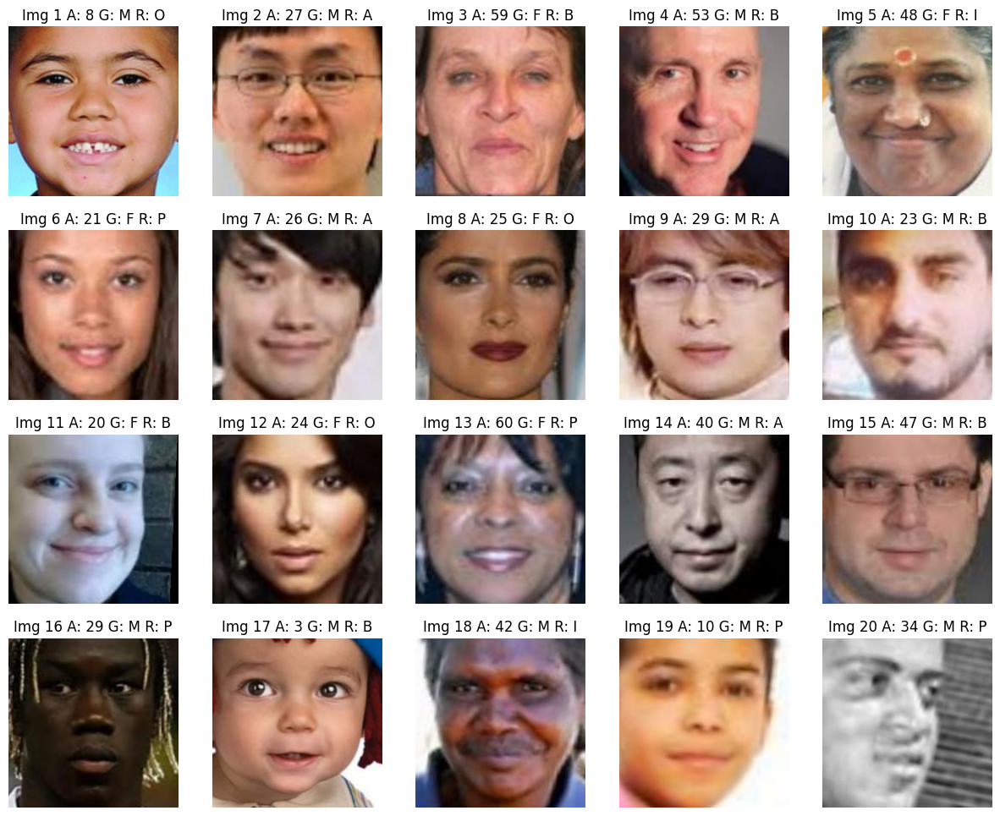

In [ ]:
fig, axs = plt.subplots(4, 5, figsize=(15, 12))

for i, ax in enumerate(axs.flatten()):
    if i < len(df_train[:20]):
        img = Image.open(os.path.join(base_dir_images,  df_train.iloc[i]['filename']))
        ax.imshow(img)
        ax.set_title(f'Img {i+1} A: {df_train.iloc[i]["age"]} G: {labels_mapping["gender"][df_train.iloc[i]["gender"]]} R: {labels_mapping["race"][df_train.iloc[i]["race"]]}')
    ax.axis('off')

plt.savefig(os.path.join(base_dir, 'Figuras/exemplos_imagens.png'))
plt.show()

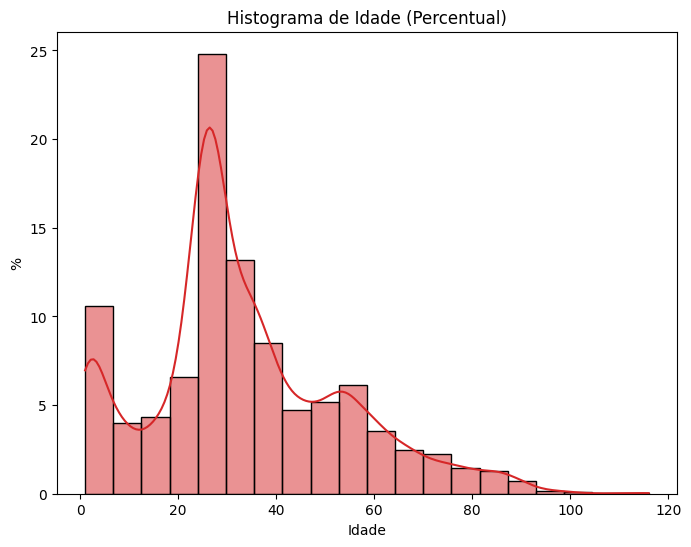

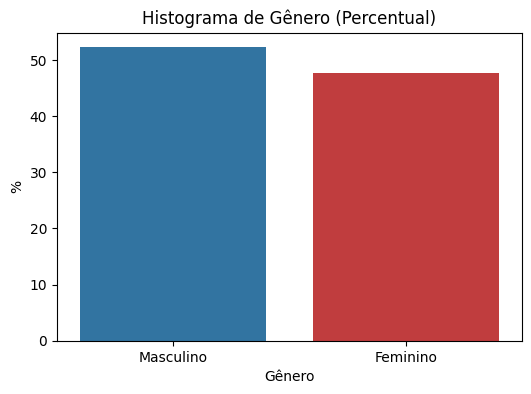

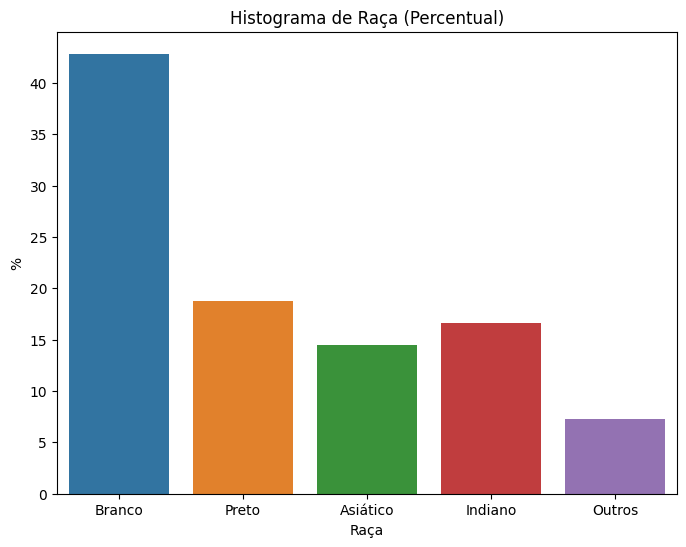

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_histograms_perc(df):
    total_rows = len(df)

    # Histograma para a coluna 'age' em percentuais
    plt.figure(figsize=(8, 6))
    sns.histplot(df['age'], bins=20, kde=True, stat='percent', color='#d62728', line_kws={'color':'red'})
    plt.title('Histograma de Idade (Percentual)')
    plt.xlabel('Idade')
    plt.ylabel('%')
    plt.savefig(os.path.join(base_dir, 'Figuras/histograma_idade.png'))
    plt.show()

    # Histograma para a coluna 'gender' em percentuais
    plt.figure(figsize=(6, 4))
    gender_counts = df['gender'].value_counts(normalize=True) * 100
    colors = ['#1f77b4' if gender == 0 else '#d62728' for gender in gender_counts.index]
    sns.barplot(x=gender_counts.index, y=gender_counts.values, palette=colors)
    plt.xticks(ticks=[0, 1], labels=['Masculino', 'Feminino'])
    plt.title('Histograma de Gênero (Percentual)')
    plt.xlabel('Gênero')
    plt.ylabel('%')
    plt.savefig(os.path.join(base_dir, 'Figuras/histograma_genero.png'))
    plt.show()

    # Histograma para a coluna 'race' em percentuais
    plt.figure(figsize=(8, 6))
    race_counts = df['race'].value_counts(normalize=True) * 100
    sns.barplot(x=race_counts.index, y=race_counts.values)
    plt.xticks(ticks=[0, 1, 2, 3, 4], labels=['Branco', 'Preto', 'Asiático', 'Indiano', 'Outros'])
    plt.title('Histograma de Raça (Percentual)')
    plt.xlabel('Raça')
    plt.ylabel('%')
    plt.savefig(os.path.join(base_dir, 'Figuras/histograma_raca.png'))
    plt.show()


plot_histograms_perc(df_train)

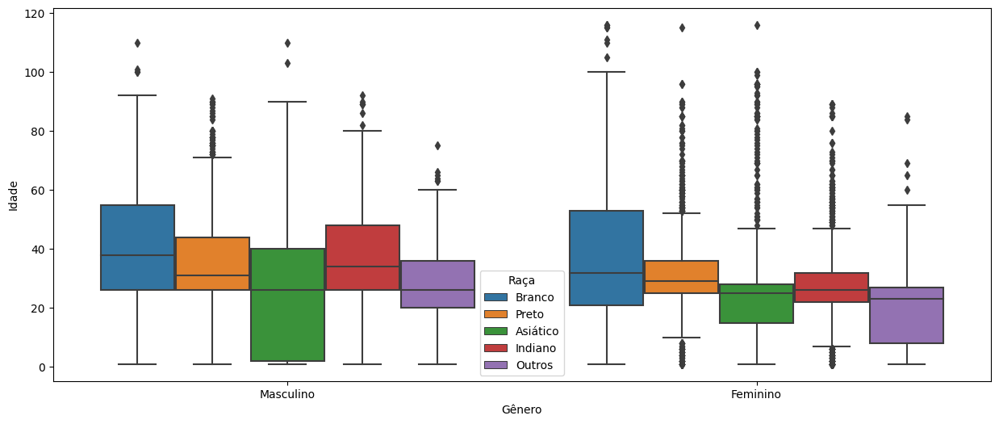

In [ ]:
gender_labels = {0: 'Masculino', 1: 'Feminino'}
race_labels = {0: 'Branco', 1: 'Preto', 2: 'Asiático', 3: 'Indiano', 4: 'Outros'}
df_renamed = df_train.replace({'gender': gender_labels, 'race': race_labels})

order = ['Masculino', 'Feminino']
hue_order = ['Branco', 'Preto', 'Asiático', 'Indiano', 'Outros']

plt.figure(figsize=(15, 6))
sns.boxplot(data=df_renamed, x='gender', y='age', hue='race', order=order, hue_order=hue_order)

# Adicionando legendas e rótulos aos eixos
plt.legend(title='Raça')
plt.xlabel('Gênero')
plt.ylabel('Idade')

plt.show()

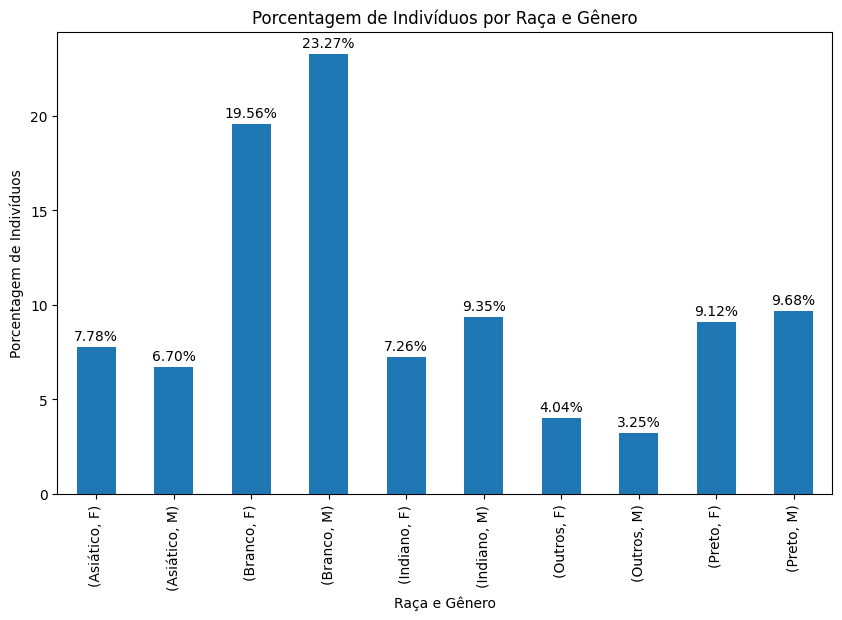

In [ ]:
counts = df_train.groupby(by=['race_desc', 'gender_desc']).size()
total = counts.sum()
percentages = (counts / total) * 100
ax = percentages.plot(kind='bar', figsize=(10, 6))

# Adicionando rótulos aos eixos x e y
plt.xlabel('Raça e Gênero')
plt.ylabel('Porcentagem de Indivíduos')
plt.title('Porcentagem de Indivíduos por Raça e Gênero')

# Adicionando os valores dos percentuais acima das barras
for i, v in enumerate(percentages):
    ax.text(i, v + 0.2, f"{v:.2f}%", ha='center', va='bottom')

plt.show()

## Preparo e funções base

In [ ]:
# Defining parameters
img = Image.open(os.path.join(base_dir_images,  df_train.iloc[0]['filename']))
image_size = img.size[0]

print(img.size)

(200, 200)


In [ ]:
import pandas as pd
import seaborn as sns
from keras.metrics import Metric
from sklearn.metrics import confusion_matrix
from keras.metrics import SparseCategoricalAccuracy
from sklearn.metrics import balanced_accuracy_score, classification_report, log_loss


class BalancedBinaryAccuracy(Metric):
    def __init__(self, name='balanced_binary_accuracy', **kwargs):
        super(BalancedBinaryAccuracy, self).__init__(name=name, **kwargs)
        self.true_positives = self.add_weight(name='tp', initializer='zeros')
        self.false_negatives = self.add_weight(name='fn', initializer='zeros')
        self.false_positives = self.add_weight(name='fp', initializer='zeros')
        self.true_negatives = self.add_weight(name='tn', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.cast(tf.greater_equal(y_pred, 0.5), tf.float32)

        true_pos = tf.reduce_sum(y_true * y_pred)
        false_neg = tf.reduce_sum(y_true * (1 - y_pred))
        false_pos = tf.reduce_sum((1 - y_true) * y_pred)
        true_neg = tf.reduce_sum((1 - y_true) * (1 - y_pred))

        self.true_positives.assign_add(true_pos)
        self.false_negatives.assign_add(false_neg)
        self.false_positives.assign_add(false_pos)
        self.true_negatives.assign_add(true_neg)

    def result(self):
        recall = self.true_positives / (self.true_positives + self.false_negatives + tf.keras.backend.epsilon())
        specificity = self.true_negatives / (self.true_negatives + self.false_positives + tf.keras.backend.epsilon())

        balanced_accuracy = (recall + specificity) / 2.0
        return balanced_accuracy


class BalancedSparseCategoricalAccuracy(SparseCategoricalAccuracy):
    def __init__(self, name='balanced_sparse_categorical_accuracy', dtype=None):
        super().__init__(name, dtype=dtype)

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_flat = y_true

        if y_true.shape.ndims == y_pred.shape.ndims:
            y_flat = tf.squeeze(y_flat, axis=[-1])
        y_true_int = tf.cast(y_flat, tf.int32)

        cls_counts = tf.math.bincount(y_true_int)
        cls_counts = tf.math.reciprocal_no_nan(tf.cast(cls_counts, self.dtype))
        weight = tf.gather(cls_counts, y_true_int)

        return super().update_state(y_true, y_pred, sample_weight=weight)


def BinaryCrossentropyScratch(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1 - tf.keras.backend.epsilon())
    term_0 = (1 - y_true) * tf.math.log(1 - y_pred + tf.keras.backend.epsilon()) * tf.constant(gender_weights[0], dtype=tf.float32)
    term_1 = y_true * tf.math.log(y_pred + tf.keras.backend.epsilon()) * tf.constant(gender_weights[1], dtype=tf.float32)
    return -tf.reduce_mean(term_0 + term_1, axis=0)

def CategoricalCrossentropyScratch(y_true, y_pred):
    y_true_one_hot = tf.one_hot(tf.cast(y_true, tf.int32), depth=y_pred.shape[1])
    y_true_one_hot = tf.cast(y_true_one_hot, tf.float32)

    log_y_pred = tf.math.log(y_pred)
    element_wise = -tf.math.multiply_no_nan(x=log_y_pred, y=y_true_one_hot)
    element_wise = tf.math.multiply(element_wise, tf.constant(list(race_weights.values()), dtype=tf.float32))
    return tf.reduce_mean(tf.reduce_sum(element_wise,axis=1))

def pad_and_preprocess_image_resnet(image):
    # Resize the image to (200, 200)
    image = tf.image.resize(image, [200, 200])

    # Pad the image to bring it to the required size of (224, 224)
    padded_image = np.pad(image, ((12, 12), (12, 12), (0, 0)), mode='constant')

    # Apply the preprocessing function for ResNet50V2
    preprocessed_image = preprocess_input_resnet(padded_image)

    return preprocessed_image

def pad_and_preprocess_image_efficient(image):
    # Resize the image to (200, 200)
    image = tf.image.resize(image, [200, 200])

    # Pad the image to bring it to the required size of (224, 224)
    padded_image = np.pad(image, ((12, 12), (12, 12), (0, 0)), mode='constant')

    # Apply the preprocessing function for EfficientNetB0
    preprocessed_image = preprocess_input_efficient(padded_image)

    return preprocessed_image

def pad_and_preprocess_image_mobilenet(image):
    # Resize the image to (200, 200)
    image = tf.image.resize(image, [200, 200])

    # Pad the image to bring it to the required size of (224, 224)
    padded_image = np.pad(image, ((12, 12), (12, 12), (0, 0)), mode='constant')

    # Apply the preprocessing function for MobileNetV2
    preprocessed_image = preprocess_input_mobilenet(padded_image)

    return preprocessed_image

def predict(category, model_name, generator):
  if category == 'race':
    tf.keras.utils.get_custom_objects()['BalancedSparseCategoricalAccuracy'] = BalancedSparseCategoricalAccuracy
    model = tf.keras.models.load_model(os.path.join(base_dir,f'Modelos/trab_final_{category}_baseline_{model_name}.keras'))
    predictions = model.predict(generator)

  elif category == 'gender':
    tf.keras.utils.get_custom_objects()['BalancedBinaryAccuracy'] = BalancedBinaryAccuracy
    model = tf.keras.models.load_model(os.path.join(base_dir,f'Modelos/trab_final_{category}_baseline_{model_name}.keras'))
    probabilities = model.predict(generator)
    predictions = (probabilities > 0.5).astype('int32')

  elif category == 'age':
    model = tf.keras.models.load_model(os.path.join(base_dir, f'Modelos/trab_final_{category}_baseline_{model_name}.keras'))
    predictions = model.predict(generator)
    predictions = np.round(predictions)

  elif category == 'multioutput':
    tf.keras.utils.get_custom_objects()['BalancedSparseCategoricalAccuracy'] = BalancedSparseCategoricalAccuracy
    tf.keras.utils.get_custom_objects()['BalancedBinaryAccuracy'] = BalancedBinaryAccuracy
    tf.keras.utils.get_custom_objects()['BinaryCrossentropyScratch'] = BinaryCrossentropyScratch
    tf.keras.utils.get_custom_objects()['CategoricalCrossentropyScratch'] = CategoricalCrossentropyScratch
    model = tf.keras.models.load_model(os.path.join(base_dir, f'Modelos/trab_final_{category}_baseline_{model_name}.keras'))
    predictions = model.predict(generator)

    predictions[0] = np.round(predictions[0])
    predictions[1] = (predictions[1] > 0.5).astype('int32')

  else:
      raise Exception('Invalid category. Please choose "race", "gender", "age" or "multioutput".')

  return predictions


def plot_accuracy_history(category, predictions, model_name, df_x, df_y, class_labels, multioutput=False):
  if multioutput:
    prefix = f'{category}_output_'
    sufix = '_multioutput'
    with open(os.path.join(base_dir, f'Modelos/trab_final_multioutput_baseline_{model_name}_history.json'), 'r') as f:
        model_history = json.load(f)
  else:
    prefix = ''
    sufix = ''
    with open(os.path.join(base_dir, f'Modelos/trab_final_{category}_baseline_{model_name}_history.json'), 'r') as f:
        model_history = json.load(f)

  if category == 'race':
    predicted_classes = np.argmax(predictions, axis=1)
    metric = f'{prefix}balanced_sparse_categorical_accuracy'
  elif category == 'gender':
    predicted_classes = predictions
    metric = f'{prefix}balanced_binary_accuracy'
  else:
    raise Exception('Invalid category. Please choose "race" or "gender".')

  # Get report
  balanced_acc = balanced_accuracy_score(df_x[category], predicted_classes)
  loss = log_loss(df_y[category], predictions)
  report = classification_report(predicted_classes, df_x[category])

  print('\n\nRelatório de classificação:')
  print(report)

  print(f'Acurácia balanceada: {balanced_acc}')
  print(f'Loss: {loss}\n')

  # Define confusion matrix
  cfm = confusion_matrix(predicted_classes, df_x[category])
  cmn = cfm / cfm.astype(float).sum(axis=1, keepdims=True)

  fig, axs = plt.subplots(1, 2, figsize=(14, 6))

  # Plot the validation metric history
  plt.style.use('ggplot')
  axs[0].plot(model_history[metric], linestyle='--', color='b', linewidth=3)
  axs[0].plot(model_history[f'val_{metric}'], linestyle='-', color='r', linewidth=3)
  axs[0].set_title(f'Acurácia Balanceada da {model_name}')
  axs[0].set_ylabel('Acurácia Balanceada')
  axs[0].set_xlabel('Época')
  axs[0].legend(['Treino', 'Validação'], loc='upper left')
  axs[0].grid(True)

  # Plot the Confusion Matrix
  sns.set(font_scale=0.9)
  heatmap = sns.heatmap(cmn, annot=True, fmt='.1%', cmap=sns.color_palette("ch:s=.25,rot=-.25", as_cmap=True), xticklabels=class_labels, yticklabels=class_labels, ax=axs[1])
  heatmap.set_xlabel('Preditos', fontsize=12)
  heatmap.set_ylabel('Verdadeiros', fontsize=12)

  # Show and save the figure
  plt.savefig(os.path.join(base_dir, f'Figuras/performance_baseline_{category}_{model_name}{sufix}.png'))
  plt.show()

def get_categorical_pred(predictions, true_values, category):
  # Convert true_values to a DataFrame if it's a dictionary
  if isinstance(true_values, dict):
    true_values = pd.DataFrame(true_values)

  # Define age groups
  age_groups = ['Criança', 'Adolescente', 'Adulto', 'Idoso']
  age_bins = [-20, 10, 20, 60, 90]

  # Bin the true ages and predicted ages
  true_bins = pd.cut(true_values[category], bins=age_bins, labels=age_groups)
  pred_bins = pd.cut(predictions.flatten(), bins=age_bins, labels=age_groups)

  return true_bins, pred_bins

def plot_mae_history(category, model_name, predictions, true_values, multioutput=False):
  # Convert true_values to a DataFrame if it's a dictionary
  if isinstance(true_values, dict):
    true_values = pd.DataFrame(true_values)

  if multioutput:
    prefix = f'{category}_output_'
    sufix = '_multioutput'
    with open(os.path.join(base_dir, f'Modelos/trab_final_multioutput_baseline_{model_name}_history.json'), 'r') as f:
        model_history = json.load(f)
  else:
    prefix = ''
    sufix = ''
    with open(os.path.join(base_dir, f'Modelos/trab_final_{category}_baseline_{model_name}_history.json'), 'r') as f:
        model_history = json.load(f)

  # Calculate the prediction errors
  errors = predictions.flatten() - true_values[category]

  # Define age groups
  age_groups = ['Criança', 'Adolescente', 'Adulto', 'Idoso']
  age_bins = [-20, 10, 20, 60, 90]

  # Bin the true ages and predicted ages
  true_bins = pd.cut(true_values[category], bins=age_bins, labels=age_groups)
  pred_bins = pd.cut(predictions.flatten(), bins=age_bins, labels=age_groups)

  # Calculate the number of correct and incorrect predictions for each age group and gender
  correct = true_values[true_bins == pred_bins].groupby([true_bins, 'gender']).size().unstack().fillna(0)
  incorrect = true_values[true_bins != pred_bins].groupby([true_bins, 'gender']).size().unstack().fillna(0)

  # Calculate the total number of predictions for each age group
  total_per_group = true_values.groupby(true_bins).size()

  # Calculate the number of correct and incorrect predictions for each age group and gender
  correct = true_values[true_bins == pred_bins].groupby([true_bins, 'gender']).size().unstack().fillna(0)
  incorrect = true_values[true_bins != pred_bins].groupby([true_bins, 'gender']).size().unstack().fillna(0)

  # Convert the counts to percentages
  correct_percentage = (correct / total_per_group[:, None]) * 100.0
  incorrect_percentage = (incorrect / total_per_group[:, None]) * 100.0

  fig, axs = plt.subplots(1, 2, figsize=(18, 6))

  # Plot the validation metric history
  plt.style.use('ggplot')
  axs[0].plot(model_history[f'{prefix}mae'], linestyle='--', color='#1f77b4', linewidth=3)
  axs[0].plot(model_history[f'val_{prefix}mae'], linestyle='-', color='#d62728', linewidth=3)
  axs[0].set_title(f'Hitórico do MAE para {model_name}')
  axs[0].set_ylabel('Mean Absolute Error')
  axs[0].set_xlabel('Época')
  axs[0].legend(['Treino', 'Validação'], loc='upper right')
  axs[0].grid(True)

  # Plot the stacked bar chart of correct and incorrect predictions by gender
  width = 0.35
  labels = age_groups
  x = np.arange(len(labels))
  axs[1].bar(x - width/2, correct_percentage[0], width, color='#1f77b4', label='Correto - Masculino')
  axs[1].bar(x - width/2, correct_percentage[1], width, bottom=correct_percentage[0], color='lightblue', label='Correto - Feminino')
  axs[1].bar(x + width/2, incorrect_percentage[0], width, color='#d62728', label='Incorreto - Masculino')
  axs[1].bar(x + width/2, incorrect_percentage[1], width, bottom=incorrect_percentage[0], color='lightsalmon', label='Incorreto - Feminino')
  axs[1].set_title('Predições Corretas vs Incorretas por Faixa de Idade e Gênero')
  axs[1].set_xlabel('Faixa de Idade')
  axs[1].set_ylabel('% de Predições')
  axs[1].set_xticks(x)
  axs[1].set_xticklabels(labels)
  axs[1].legend()

  # Show and save the figure
  plt.savefig(os.path.join(base_dir, f'Figuras/performance_baseline_{category}_{model_name}{sufix}.png'))
  plt.show()

## Baseline - Raça

In [ ]:
from keras.optimizers import Adam
from keras.applications.resnet_v2 import preprocess_input as preprocess_input_resnet
from keras.applications.efficientnet import preprocess_input as preprocess_input_efficient
from keras.applications.mobilenet_v2 import preprocess_input as preprocess_input_mobilenet

race_model_epochs = 100
race_baseline_epochs = 50
race_model_batch_size = 32
race_baseline_batch_size = 32

class_labels_race = ['Branco', 'Preto', 'Asiático', 'Indiano', 'Outros']

# Define the dictionary for class weights
class_weights_race = class_weight.compute_class_weight('balanced', classes=np.unique(df_train['race']), y=df_train['race'])
class_weights_race = dict(enumerate(class_weights_race))

### Baseline 1: ResNet50V2

#### Pré-Processamento

In [ ]:
# Preprocessing for ResNet50V2
generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=pad_and_preprocess_image_resnet)

train_generator = generator.flow_from_dataframe(
        df_train, directory=base_dir_images, x_col='filename', y_col=['race'], image_size=(224, 224),
        target_size=(224, 224), class_mode='raw', batch_size=race_baseline_batch_size, shuffle=True)

val_generator = generator.flow_from_dataframe(
        df_val, directory=base_dir_images, x_col='filename', y_col=['race'], image_size=(224, 224),
        target_size=(224, 224), class_mode='raw', batch_size=race_baseline_batch_size, shuffle=False)

Found 15170 validated image filenames.
Found 3793 validated image filenames.


/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1137: UserWarning: Found 2 invalid image filename(s) in x_col="filename". These filename(s) will be ignored.
  warnings.warn(


#### Treinamento do Modelo (Não Execute Novamente)

In [ ]:
# Baseline ResNet50V2
backbone = tf.keras.applications.resnet_v2.ResNet50V2(include_top=False, input_shape=(224, 224, 3), pooling='avg')

for layer in backbone.layers:
  layer.trainable = False

model = tf.keras.Sequential([
    backbone,
    tf.keras.layers.Dense(5, activation='softmax')
])

model.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=[BalancedSparseCategoricalAccuracy()])

history = model.fit(train_generator, epochs=race_baseline_epochs, validation_data=val_generator, batch_size=race_baseline_batch_size, class_weight=class_weights_race)

model.save(os.path.join(base_dir, 'Modelos/trab_final_race_baseline_ResNet50V2.keras'))

with open(os.path.join(base_dir, 'Modelos/trab_final_race_baseline_ResNet50V2_history.json'), 'w') as f:
    json.dump(history.history, f)

94668760/94668760 [==============================] - 1s 0us/step
Epoch 1/50
475/475 [==============================] - 136s 256ms/step - loss: 1.5545 - balanced_sparse_categorical_accuracy: 0.3261 - val_loss: 1.3636 - val_balanced_sparse_categorical_accuracy: 0.4399
Epoch 2/50
475/475 [==============================] - 122s 258ms/step - loss: 1.3505 - balanced_sparse_categorical_accuracy: 0.4731 - val_loss: 1.3034 - val_balanced_sparse_categorical_accuracy: 0.4901
Epoch 3/50
475/475 [==============================] - 110s 231ms/step - loss: 1.2604 - balanced_sparse_categorical_accuracy: 0.5176 - val_loss: 1.2022 - val_balanced_sparse_categorical_accuracy: 0.5359
Epoch 4/50
475/475 [==============================] - 123s 258ms/step - loss: 1.2013 - balanced_sparse_categorical_accuracy: 0.5452 - val_loss: 1.1617 - val_balanced_sparse_categorical_accuracy: 0.5531
Epoch 5/50
475/475 [==============================] - 125s 264ms/step - loss: 1.1593 - balanced_sparse_categorical_accuracy: 0.

#### Resultado

In [ ]:
predictions_resnet_race = predict('race', 'ResNet50V2', val_generator)

119/119 [==============================] - 20s 164ms/step




Relatório de classificação:
              precision    recall  f1-score   support

           0       0.63      0.87      0.73      1172
           1       0.71      0.79      0.75       666
           2       0.69      0.64      0.66       582
           3       0.60      0.57      0.58       651
           4       0.52      0.19      0.27       722

    accuracy                           0.64      3793
   macro avg       0.63      0.61      0.60      3793
weighted avg       0.63      0.64      0.61      3793

Acurácia balanceada: 0.6293385421942841
Loss: 0.9515452276851878



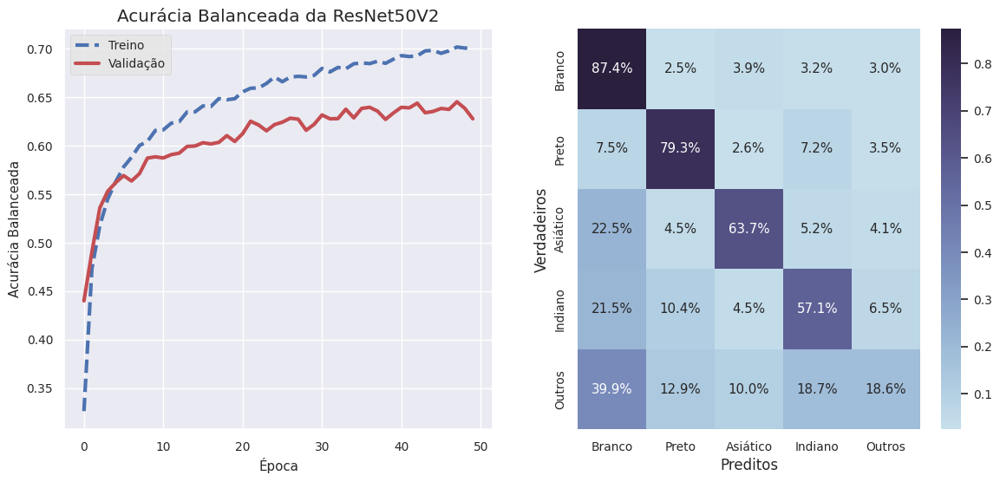

In [ ]:
plot_accuracy_history('race', predictions_resnet_race, 'ResNet50V2', df_val, y_val, class_labels_race)

### Baseline 2: EfficientNetB0

#### Pré-Processamento

In [ ]:
# Preprocessing for EfficientNetB0
generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=pad_and_preprocess_image_efficient)

train_generator = generator.flow_from_dataframe(
        df_train, directory=base_dir_images, x_col='filename', y_col=['race'], image_size=(224, 224),
        target_size=(224, 224), class_mode='raw', batch_size=race_baseline_batch_size, shuffle=True)

val_generator = generator.flow_from_dataframe(
        df_val, directory=base_dir_images, x_col='filename', y_col=['race'], image_size=(224, 224),
        target_size=(224, 224), class_mode='raw', batch_size=race_baseline_batch_size, shuffle=False)

Found 15170 validated image filenames.
Found 3793 validated image filenames.


/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1137: UserWarning: Found 2 invalid image filename(s) in x_col="filename". These filename(s) will be ignored.
  warnings.warn(


#### Treinamento do Modelo (Não Execute Novamente)

In [ ]:
# Baseline EfficientNetB0
backbone = tf.keras.applications.EfficientNetB0(include_top=False, input_shape=(224, 224, 3), pooling='avg')

for layer in backbone.layers:
  layer.trainable = False

model = tf.keras.Sequential([
    backbone,
    tf.keras.layers.Dense(5, activation='softmax')
])

model.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=[BalancedSparseCategoricalAccuracy()])

history = model.fit(train_generator, epochs=race_baseline_epochs, validation_data=val_generator, batch_size=race_baseline_batch_size, class_weight=class_weights)

model.save(os.path.join(base_dir, 'Modelos/trab_final_race_baseline_EfficientNetB0.keras'))

with open(os.path.join(base_dir, 'Modelos/trab_final_race_baseline_EfficientNetB0_history.json'), 'w') as f:
    json.dump(history.history, f)

16705208/16705208 [==============================] - 0s 0us/step
Epoch 1/50
475/475 [==============================] - 99s 189ms/step - loss: 1.5041 - balanced_sparse_categorical_accuracy: 0.3579 - val_loss: 1.3572 - val_balanced_sparse_categorical_accuracy: 0.4617
Epoch 2/50
475/475 [==============================] - 88s 186ms/step - loss: 1.3769 - balanced_sparse_categorical_accuracy: 0.4590 - val_loss: 1.2578 - val_balanced_sparse_categorical_accuracy: 0.5021
Epoch 3/50
475/475 [==============================] - 88s 185ms/step - loss: 1.3053 - balanced_sparse_categorical_accuracy: 0.5058 - val_loss: 1.2083 - val_balanced_sparse_categorical_accuracy: 0.5240
Epoch 4/50
475/475 [==============================] - 87s 183ms/step - loss: 1.2542 - balanced_sparse_categorical_accuracy: 0.5236 - val_loss: 1.1767 - val_balanced_sparse_categorical_accuracy: 0.5314
Epoch 5/50
475/475 [==============================] - 91s 193ms/step - loss: 1.2214 - balanced_sparse_categorical_accuracy: 0.5320 

#### Resultado

In [ ]:
predictions_efficientnet_race = predict('race', 'EfficientNetB0', val_generator)

119/119 [==============================] - 20s 142ms/step




Relatório de classificação:
              precision    recall  f1-score   support

           0       0.68      0.87      0.76      1285
           1       0.71      0.80      0.75       661
           2       0.72      0.66      0.69       587
           3       0.56      0.59      0.57       589
           4       0.50      0.19      0.28       671

    accuracy                           0.66      3793
   macro avg       0.64      0.62      0.61      3793
weighted avg       0.64      0.66      0.63      3793

Acurácia balanceada: 0.6352045750841961
Loss: 0.9190754853952812



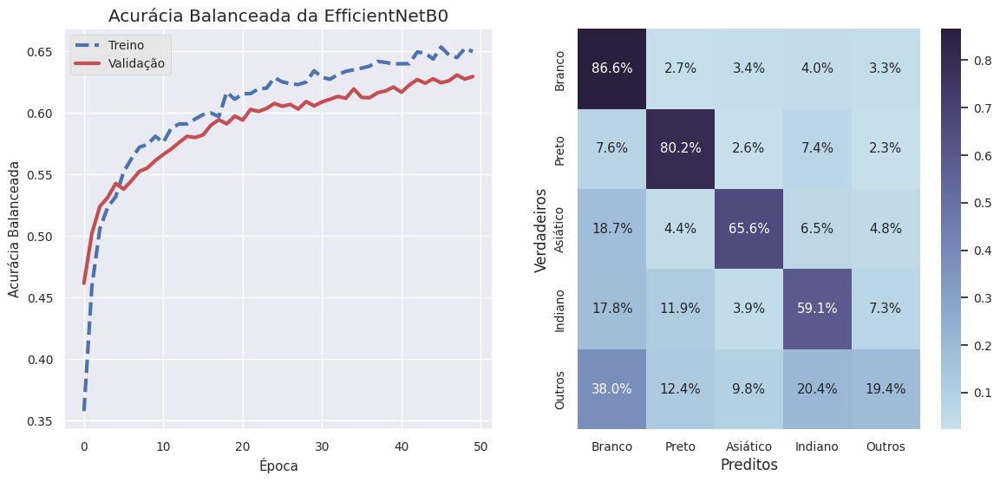

In [ ]:
plot_accuracy_history('race', predictions_efficientnet_race, 'EfficientNetB0', df_val, y_val, class_labels_race)

### Baseline 3: MobileNetV2

#### Pré-Processamento

In [ ]:
# Preprocessing for MobileNetV2
generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=pad_and_preprocess_image_mobilenet)

train_generator = generator.flow_from_dataframe(
        df_train, directory=base_dir_images, x_col='filename', y_col=['race'], image_size=(224, 224),
        target_size=(224, 224), class_mode='raw', batch_size=race_baseline_batch_size, shuffle=True)

val_generator = generator.flow_from_dataframe(
        df_val, directory=base_dir_images, x_col='filename', y_col=['race'], image_size=(224, 224),
        target_size=(224, 224), class_mode='raw', batch_size=race_baseline_batch_size, shuffle=False)

Found 15170 validated image filenames.
Found 3793 validated image filenames.


/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1137: UserWarning: Found 2 invalid image filename(s) in x_col="filename". These filename(s) will be ignored.
  warnings.warn(


#### Treinamento do Modelo (Não Execute Novamente)

In [ ]:
# Baseline MobileNetV2
backbone_mnet = tf.keras.applications.MobileNetV2(include_top=False, input_shape=(224, 224, 3), pooling='avg')

for layer in backbone_mnet.layers:
  layer.trainable = False

model_mnet = tf.keras.Sequential([
    backbone_mnet,
    tf.keras.layers.Dense(5, activation='softmax')
])

model.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=[BalancedSparseCategoricalAccuracy()])

history = model.fit(train_generator, epochs=race_baseline_epochs, validation_data=val_generator, batch_size=race_baseline_batch_size, class_weight=class_weights)

model.save(os.path.join(base_dir, 'Modelos/trab_final_race_baseline_MobileNetV2.keras'))

with open(os.path.join(base_dir, 'Modelos/trab_final_race_baseline_MobileNetV2_history.json'), 'w') as f:
    json.dump(history.history, f)

9406464/9406464 [==============================] - 0s 0us/step
Epoch 1/50
475/475 [==============================] - 103s 203ms/step - loss: 1.6193 - balanced_sparse_categorical_accuracy: 0.1992 - val_loss: 1.5925 - val_balanced_sparse_categorical_accuracy: 0.2004
Epoch 2/50
475/475 [==============================] - 92s 194ms/step - loss: 1.6145 - balanced_sparse_categorical_accuracy: 0.1969 - val_loss: 1.6286 - val_balanced_sparse_categorical_accuracy: 0.2021
Epoch 3/50
475/475 [==============================] - 93s 195ms/step - loss: 1.6123 - balanced_sparse_categorical_accuracy: 0.1980 - val_loss: 1.5994 - val_balanced_sparse_categorical_accuracy: 0.2279
Epoch 4/50
475/475 [==============================] - 91s 191ms/step - loss: 1.6109 - balanced_sparse_categorical_accuracy: 0.2161 - val_loss: 1.5891 - val_balanced_sparse_categorical_accuracy: 0.2105
Epoch 5/50
475/475 [==============================] - 90s 190ms/step - loss: 1.6096 - balanced_sparse_categorical_accuracy: 0.2107 -

#### Resultado

In [ ]:
predictions_mobilenet_race = predict('race', 'MobileNetV2', val_generator)

119/119 [==============================] - 19s 144ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-37-449cd291240e>:142: RuntimeWarning: invalid value encountered in divide



Relatório de classificação:
              precision    recall  f1-score   support

           0       0.06      0.58      0.11       175
           1       0.00      0.33      0.00         3
           2       0.33      0.17      0.23      1040
           3       0.00      0.00      0.00         0
           4       0.70      0.07      0.13      2575

    accuracy                           0.12      3793
   macro avg       0.22      0.23      0.09      3793
weighted avg       0.57      0.12      0.15      3793

Acurácia balanceada: 0.21883810237660514
Loss: 1.6111018995969417



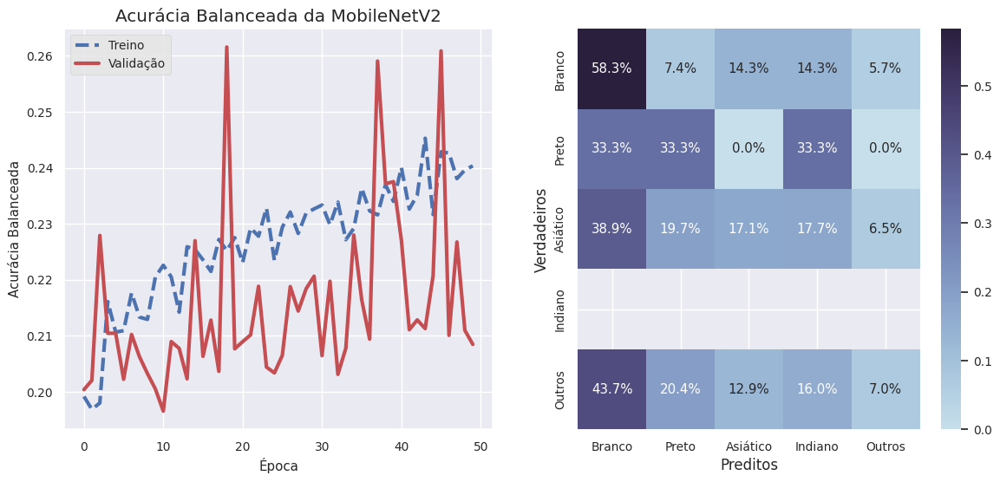

In [ ]:
plot_accuracy_history('race', predictions_mobilenet_race, 'MobileNetV2', df_val, y_val, class_labels_race)

## Baseline - Gênero

In [ ]:
from keras.optimizers import Adam
from keras.applications.resnet_v2 import preprocess_input as preprocess_input_resnet
from keras.applications.efficientnet import preprocess_input as preprocess_input_efficient
from keras.applications.mobilenet_v2 import preprocess_input as preprocess_input_mobilenet

gender_model_epochs = 100
gender_baseline_epochs = 50
gender_model_batch_size = 32
gender_baseline_batch_size = 32

class_labels_gender = ['Masculino', 'Feminino']

# Define the dictionary for class weights
class_weights_gender = class_weight.compute_class_weight('balanced', classes=np.unique(df_train['gender']), y=df_train['gender'])
class_weights_gender = dict(enumerate(class_weights_gender))

### Baseline 1: ResNet50V2

#### Pré-Processamento

In [ ]:
# Preprocessing for ResNet50V2
generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=pad_and_preprocess_image_resnet)

train_generator = generator.flow_from_dataframe(
        df_train, directory=base_dir_images, x_col='filename', y_col=['gender'], image_size=(224, 224),
        target_size=(224, 224), class_mode='raw', batch_size=gender_baseline_batch_size, shuffle=True)

val_generator = generator.flow_from_dataframe(
        df_val, directory=base_dir_images, x_col='filename', y_col=['gender'], image_size=(224, 224),
        target_size=(224, 224), class_mode='raw', batch_size=gender_baseline_batch_size, shuffle=False)

Found 15170 validated image filenames.
Found 3793 validated image filenames.


/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1137: UserWarning: Found 2 invalid image filename(s) in x_col="filename". These filename(s) will be ignored.
  warnings.warn(


#### Treinamento do Modelo (Não Execute Novamente)

In [ ]:
# Baseline ResNet50V2
backbone = tf.keras.applications.resnet_v2.ResNet50V2(include_top=False, input_shape=(224, 224, 3), pooling='avg')

for layer in backbone.layers:
  layer.trainable = False

model = tf.keras.Sequential([
    backbone,
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer=Adam(learning_rate=0.0001), loss=tf.keras.losses.BinaryCrossentropy(from_logits=False), metrics=[[BalancedBinaryAccuracy()]])

history = model.fit(train_generator, epochs=gender_baseline_epochs, validation_data=val_generator, batch_size=gender_baseline_batch_size, class_weight=class_weights_gender)

model.save(os.path.join(base_dir, 'Modelos/trab_final_gender_baseline_ResNet50V2.keras'))

with open(os.path.join(base_dir, 'Modelos/trab_final_gender_baseline_ResNet50V2_history.json'), 'w') as f:
    json.dump(history.history, f)

Epoch 1/50
475/475 [==============================] - 137s 275ms/step - loss: 0.6139 - balanced_binary_accuracy: 0.6849 - val_loss: 0.5240 - val_balanced_binary_accuracy: 0.7668
Epoch 2/50
475/475 [==============================] - 127s 267ms/step - loss: 0.4853 - balanced_binary_accuracy: 0.7834 - val_loss: 0.4673 - val_balanced_binary_accuracy: 0.7881
Epoch 3/50
475/475 [==============================] - 130s 275ms/step - loss: 0.4443 - balanced_binary_accuracy: 0.8044 - val_loss: 0.4387 - val_balanced_binary_accuracy: 0.8035
Epoch 4/50
475/475 [==============================] - 111s 234ms/step - loss: 0.4213 - balanced_binary_accuracy: 0.8148 - val_loss: 0.4194 - val_balanced_binary_accuracy: 0.8135
Epoch 5/50
475/475 [==============================] - 126s 266ms/step - loss: 0.4056 - balanced_binary_accuracy: 0.8231 - val_loss: 0.4066 - val_balanced_binary_accuracy: 0.8182
Epoch 6/50
475/475 [==============================] - 128s 270ms/step - loss: 0.3942 - balanced_binary_accurac

#### Resultado

In [ ]:
predictions_resnet_gender = predict('gender', 'ResNet50V2', val_generator)

119/119 [==============================] - 21s 169ms/step




Relatório de classificação:
              precision    recall  f1-score   support

           0       0.88      0.86      0.87      2050
           1       0.84      0.87      0.85      1743

    accuracy                           0.86      3793
   macro avg       0.86      0.86      0.86      3793
weighted avg       0.86      0.86      0.86      3793

Acurácia balanceada: 0.8620411128942858
Loss: 4.931889298431797



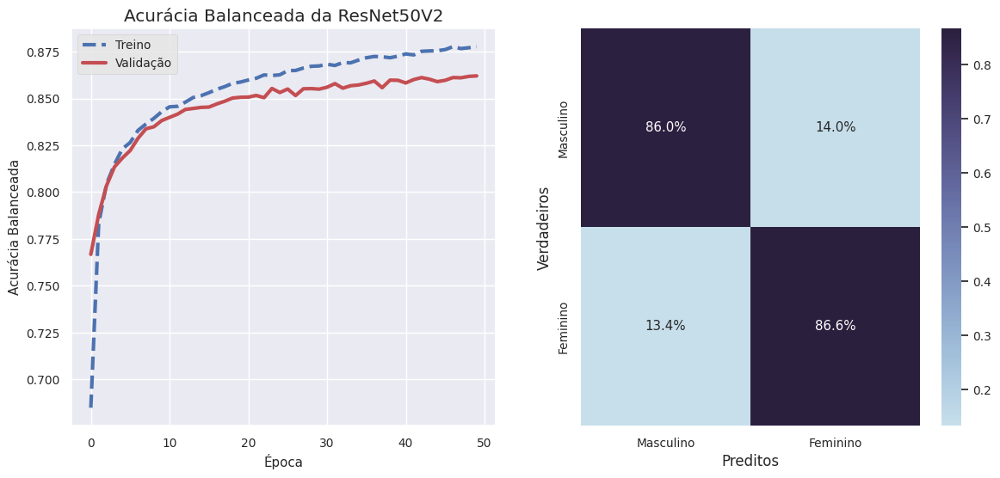

In [ ]:
plot_accuracy_history('gender', predictions_resnet_gender, 'ResNet50V2', df_val, y_val, class_labels_gender)

### Baseline 2: EfficientNetB0

#### Pré-Processamento

In [ ]:
# Preprocessing for EfficientNetB0
generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=pad_and_preprocess_image_efficient)

train_generator = generator.flow_from_dataframe(
        df_train, directory=base_dir_images, x_col='filename', y_col=['gender'], image_size=(224, 224),
        target_size=(224, 224), class_mode='raw', batch_size=gender_baseline_batch_size, shuffle=True)

val_generator = generator.flow_from_dataframe(
        df_val, directory=base_dir_images, x_col='filename', y_col=['gender'], image_size=(224, 224),
        target_size=(224, 224), class_mode='raw', batch_size=gender_baseline_batch_size, shuffle=False)

Found 15170 validated image filenames.
Found 3793 validated image filenames.


/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1137: UserWarning: Found 2 invalid image filename(s) in x_col="filename". These filename(s) will be ignored.
  warnings.warn(


#### Treinamento do Modelo (Não Execute Novamente)

In [ ]:
# Baseline EfficientNetB0
backbone = tf.keras.applications.EfficientNetB0(include_top=False, input_shape=(224, 224, 3), pooling='avg')

for layer in backbone.layers:
  layer.trainable = False

model = tf.keras.Sequential([
    backbone,
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer=Adam(learning_rate=0.0001), loss=tf.keras.losses.BinaryCrossentropy(from_logits=False), metrics=[[BalancedBinaryAccuracy()]])

history = model.fit(train_generator, epochs=gender_baseline_epochs, validation_data=val_generator, batch_size=gender_baseline_batch_size, class_weight=class_weights_gender)

model.save(os.path.join(base_dir, 'Modelos/trab_final_gender_baseline_EfficientNetB0.keras'))

with open(os.path.join(base_dir, 'Modelos/trab_final_gender_baseline_EfficientNetB0_history.json'), 'w') as f:
    json.dump(history.history, f)

Epoch 1/50
475/475 [==============================] - 105s 192ms/step - loss: 0.5799 - balanced_binary_accuracy: 0.7203 - val_loss: 0.5008 - val_balanced_binary_accuracy: 0.7875
Epoch 2/50
475/475 [==============================] - 92s 193ms/step - loss: 0.4820 - balanced_binary_accuracy: 0.7878 - val_loss: 0.4481 - val_balanced_binary_accuracy: 0.8058
Epoch 3/50
475/475 [==============================] - 88s 186ms/step - loss: 0.4474 - balanced_binary_accuracy: 0.7978 - val_loss: 0.4227 - val_balanced_binary_accuracy: 0.8135
Epoch 4/50
475/475 [==============================] - 91s 191ms/step - loss: 0.4245 - balanced_binary_accuracy: 0.8139 - val_loss: 0.4057 - val_balanced_binary_accuracy: 0.8196
Epoch 5/50
475/475 [==============================] - 88s 186ms/step - loss: 0.4109 - balanced_binary_accuracy: 0.8178 - val_loss: 0.3932 - val_balanced_binary_accuracy: 0.8271
Epoch 6/50
475/475 [==============================] - 88s 185ms/step - loss: 0.4026 - balanced_binary_accuracy: 0.

#### Resultado

In [ ]:
predictions_efficientnet_gender = predict('gender', 'EfficientNetB0', val_generator)

119/119 [==============================] - 18s 137ms/step




Relatório de classificação:
              precision    recall  f1-score   support

           0       0.89      0.87      0.88      2057
           1       0.85      0.88      0.86      1736

    accuracy                           0.87      3793
   macro avg       0.87      0.87      0.87      3793
weighted avg       0.87      0.87      0.87      3793

Acurácia balanceada: 0.8685526898365366
Loss: 4.694322376542018



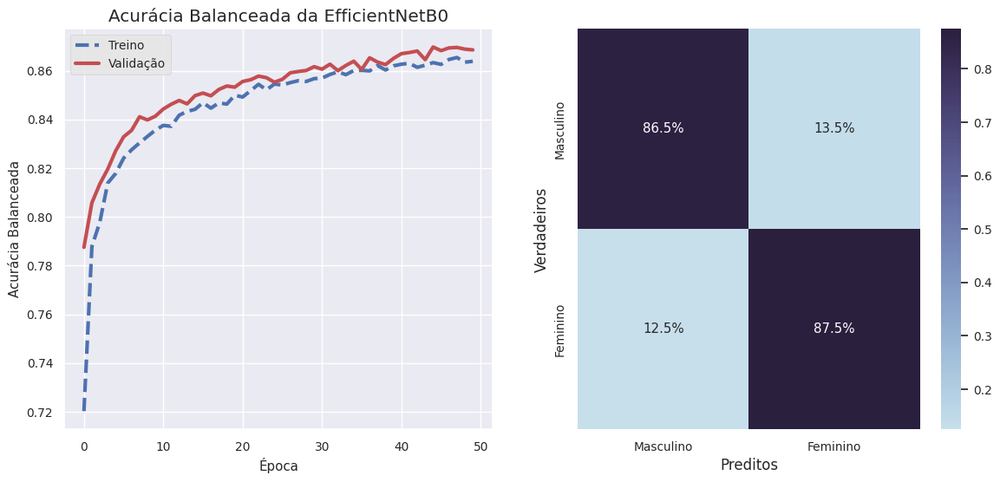

In [ ]:
plot_accuracy_history('gender', predictions_efficientnet_gender, 'EfficientNetB0', df_val, y_val, class_labels_gender)

## Baseline - Idade

In [ ]:
from keras.optimizers import Adam
from keras.applications.resnet_v2 import preprocess_input as preprocess_input_resnet
from keras.applications.efficientnet import preprocess_input as preprocess_input_efficient
from keras.applications.mobilenet_v2 import preprocess_input as preprocess_input_mobilenet

age_model_epochs = 100
age_baseline_epochs = 50
age_model_batch_size = 32
age_baseline_batch_size = 32

#### Pré-Processamento

In [ ]:
# Preprocessing for ResNet50V2
generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=pad_and_preprocess_image_resnet)

train_generator = generator.flow_from_dataframe(
        df_train, directory=base_dir_images, x_col='filename', y_col=['age'], image_size=(224, 224),
        target_size=(224, 224), class_mode='raw', batch_size=age_baseline_batch_size, shuffle=True)

val_generator = generator.flow_from_dataframe(
        df_val, directory=base_dir_images, x_col='filename', y_col=['age'], image_size=(224, 224),
        target_size=(224, 224), class_mode='raw', batch_size=age_baseline_batch_size, shuffle=False)

Found 15170 validated image filenames.
Found 3793 validated image filenames.


/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1137: UserWarning: Found 2 invalid image filename(s) in x_col="filename". These filename(s) will be ignored.
  warnings.warn(


#### Treinamento do Modelo (Não Execute Novamente)

In [ ]:
# Baseline ResNet50V2
backbone = tf.keras.applications.resnet_v2.ResNet50V2(include_top=False, input_shape=(224, 224, 3), pooling='avg')

for layer in backbone.layers:
  layer.trainable = False

model = tf.keras.Sequential([
    backbone,
    tf.keras.layers.Dense(1)
])

model.compile(optimizer=Adam(learning_rate=0.0001), loss='mae', metrics=['mae'])

history = model.fit(train_generator, epochs=age_baseline_epochs, validation_data=val_generator, batch_size=age_baseline_batch_size)

model.save(os.path.join(base_dir, 'Modelos/trab_final_age_baseline_ResNet50V2.keras'))

with open(os.path.join(base_dir, 'Modelos/trab_final_age_baseline_ResNet50V2_history.json'), 'w') as f:
    json.dump(history.history, f)


94668760/94668760 [==============================] - 1s 0us/step
Epoch 1/50
475/475 [==============================] - 111s 227ms/step - loss: 25.5689 - mae: 25.5689 - val_loss: 19.2644 - val_mae: 19.2644
Epoch 2/50
475/475 [==============================] - 128s 270ms/step - loss: 16.3184 - mae: 16.3184 - val_loss: 14.4318 - val_mae: 14.4318
Epoch 3/50
475/475 [==============================] - 129s 271ms/step - loss: 14.0649 - mae: 14.0649 - val_loss: 13.3563 - val_mae: 13.3563
Epoch 4/50
475/475 [==============================] - 107s 224ms/step - loss: 13.1372 - mae: 13.1372 - val_loss: 12.5079 - val_mae: 12.5079
Epoch 5/50
475/475 [==============================] - 103s 217ms/step - loss: 12.4248 - mae: 12.4248 - val_loss: 11.9235 - val_mae: 11.9235
Epoch 6/50
475/475 [==============================] - 103s 217ms/step - loss: 11.9694 - mae: 11.9694 - val_loss: 11.5542 - val_mae: 11.5542
Epoch 7/50
475/475 [==============================] - 104s 219ms/step - loss: 11.6513 - mae: 11

### Resultado

In [ ]:
predictions_resnet_age = predict('age', 'ResNet50V2', val_generator)

119/119 [==============================] - 21s 171ms/step


<ipython-input-72-17575202f93c>:255: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  correct_percentage = (correct / total_per_group[:, None]) * 100.0
<ipython-input-72-17575202f93c>:256: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  incorrect_percentage = (incorrect / total_per_group[:, None]) * 100.0


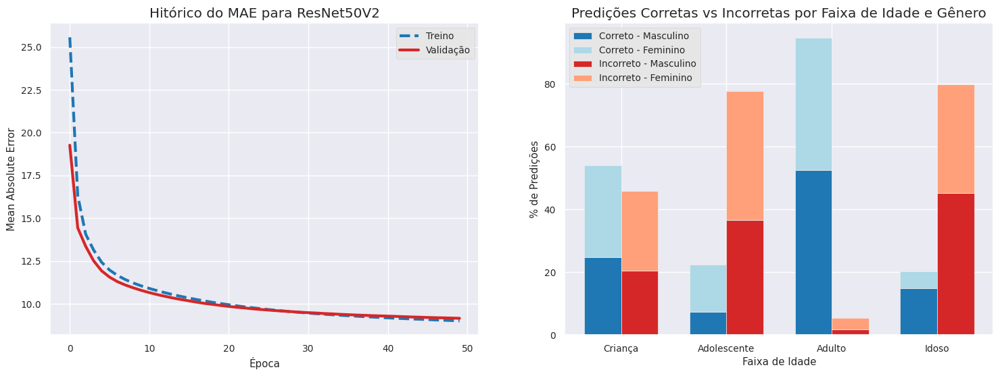

In [ ]:
plot_mae_history('age', 'ResNet50V2', predictions_resnet_age, y_val)

## Baseline - Multiplas Saídas

In [ ]:
from keras.optimizers import Adam
from keras.applications.resnet_v2 import preprocess_input as preprocess_input_resnet

baseline_epochs = 50
baseline_batch_size = 32

#### Pré-Processamento

In [ ]:
from sklearn.utils import class_weight
import numpy as np

# Compute class weights for gender
gender_weights = class_weight.compute_class_weight('balanced', classes=np.unique(df_train['gender']), y=df_train['gender'])
gender_weights = dict(enumerate(gender_weights))

# Compute class weights for race
race_weights = class_weight.compute_class_weight('balanced', classes=np.unique(df_train['race']), y=df_train['race'])
race_weights = dict(enumerate(race_weights))

In [ ]:
# Preprocessing for ResNet50V2
generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=pad_and_preprocess_image_resnet)

train_generator = generator.flow_from_dataframe(
        df_train, directory=base_dir_images, x_col='filename', y_col=['age', 'gender', 'race'], image_size=(224, 224),
        target_size=(224, 224), class_mode='multi_output', batch_size=baseline_epochs, shuffle=True)

val_generator = generator.flow_from_dataframe(
        df_val, directory=base_dir_images, x_col='filename', y_col=['age', 'gender', 'race'], image_size=(224, 224),
        target_size=(224, 224), class_mode='multi_output', batch_size=baseline_epochs, shuffle=False)

Found 15170 validated image filenames.


/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:1137: UserWarning: Found 2 invalid image filename(s) in x_col="filename". These filename(s) will be ignored.
  warnings.warn(


Found 3793 validated image filenames.


#### Treinamento do Modelo (Não Execute Novamente)

In [ ]:
# Baseline ResNet50V2
backbone = tf.keras.applications.resnet_v2.ResNet50V2(include_top=False, input_shape=(224, 224, 3), pooling='avg')

for layer in backbone.layers:
  layer.trainable = False

# Define separate output layers for age, gender, and race
age_output = tf.keras.layers.Dense(1, name='age_output')(backbone.output)
gender_output = tf.keras.layers.Dense(1, activation='sigmoid', name='gender_output')(backbone.output)
race_output = tf.keras.layers.Dense(5, activation='softmax', name='race_output')(backbone.output)

# Combine the outputs into a single model
model = tf.keras.Model(inputs=backbone.input, outputs=[age_output, gender_output, race_output])

# Compile the model with appropriate loss functions and metrics
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss={'age_output': 'mae', 'gender_output': BinaryCrossentropyScratch, 'race_output': CategoricalCrossentropyScratch},
              metrics={'age_output': ['mae'], 'gender_output': [BalancedBinaryAccuracy()], 'race_output': [BalancedSparseCategoricalAccuracy()]})

# Fit the model
history = model.fit(train_generator, epochs=baseline_epochs, validation_data=val_generator, batch_size=baseline_batch_size)

# Save the model
model.save(os.path.join(base_dir, 'Modelos/trab_final_multioutput_baseline_ResNet50V2.keras'))

# Save the history
with open(os.path.join(base_dir, 'Modelos/trab_final_multioutput_baseline_ResNet50V2_history.json'), 'w') as f:
    json.dump(history.history, f)

94668760/94668760 [==============================] - 6s 0us/step
Epoch 1/50
304/304 [==============================] - 131s 376ms/step - loss: 44.6341 - age_output_loss: 27.3715 - gender_output_loss: 0.5593 - race_output_loss: 16.7034 - age_output_mae: 27.3715 - gender_output_balanced_binary_accuracy: 0.7245 - race_output_balanced_sparse_categorical_accuracy: 0.1830 - val_loss: 39.6422 - val_age_output_loss: 22.8802 - val_gender_output_loss: 0.5075 - val_race_output_loss: 16.2545 - val_age_output_mae: 22.8802 - val_gender_output_balanced_binary_accuracy: 0.7653 - val_race_output_balanced_sparse_categorical_accuracy: 0.1875
Epoch 2/50
304/304 [==============================] - 113s 372ms/step - loss: 36.5203 - age_output_loss: 19.6249 - gender_output_loss: 0.4806 - race_output_loss: 16.4148 - age_output_mae: 19.6249 - gender_output_balanced_binary_accuracy: 0.7781 - race_output_balanced_sparse_categorical_accuracy: 0.2008 - val_loss: 33.0280 - val_age_output_loss: 16.4184 - val_gender_o

### Resultado

In [ ]:
predictions_resnet_multioutput = predict('multioutput', 'ResNet50V2', val_generator)

119/119 [==============================] - 20s 163ms/step


In [ ]:
predictions_resnet_multioutput[2]

array([[0.19954951, 0.20784785, 0.20386079, 0.20308796, 0.18565395],
       [0.20716582, 0.20508121, 0.20084025, 0.18306634, 0.20384638],
       [0.22865942, 0.1944648 , 0.18298651, 0.20048691, 0.19340229],
       ...,
       [0.20391421, 0.20597635, 0.1808541 , 0.1988593 , 0.21039602],
       [0.20450474, 0.20756614, 0.2011277 , 0.15878648, 0.228015  ],
       [0.24098901, 0.18968572, 0.17587133, 0.19922028, 0.1942337 ]],
      dtype=float32)

<ipython-input-72-17575202f93c>:255: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  correct_percentage = (correct / total_per_group[:, None]) * 100.0
<ipython-input-72-17575202f93c>:256: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  incorrect_percentage = (incorrect / total_per_group[:, None]) * 100.0


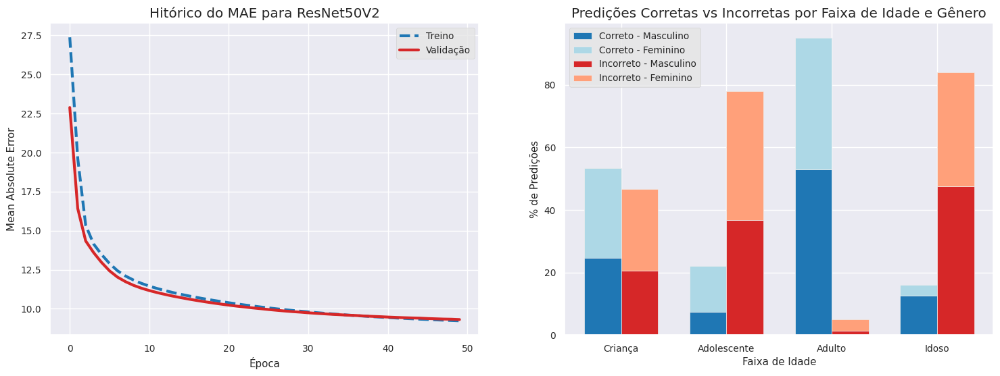



Relatório de classificação:
              precision    recall  f1-score   support

           0       0.87      0.87      0.87      1993
           1       0.85      0.85      0.85      1800

    accuracy                           0.86      3793
   macro avg       0.86      0.86      0.86      3793
weighted avg       0.86      0.86      0.86      3793

Acurácia balanceada: 0.860460233780515
Loss: 5.017413390312115



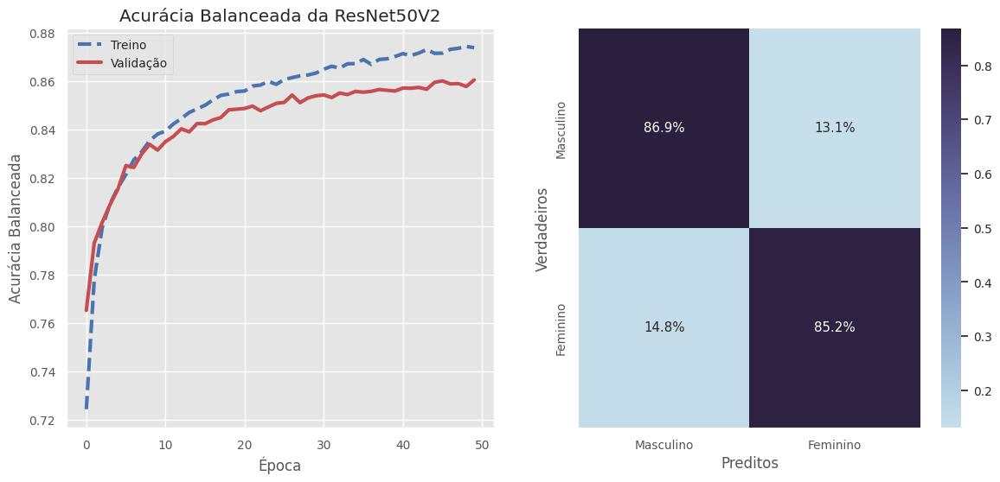



Relatório de classificação:
              precision    recall  f1-score   support

           0       0.32      0.52      0.39       985
           1       0.53      0.25      0.34      1560
           2       0.07      0.42      0.11        84
           3       0.08      0.23      0.12       213
           4       0.36      0.10      0.16       951

    accuracy                           0.29      3793
   macro avg       0.27      0.30      0.22      3793
weighted avg       0.40      0.29      0.29      3793

Acurácia balanceada: 0.27064687227577117
Loss: 1.5769732095091054



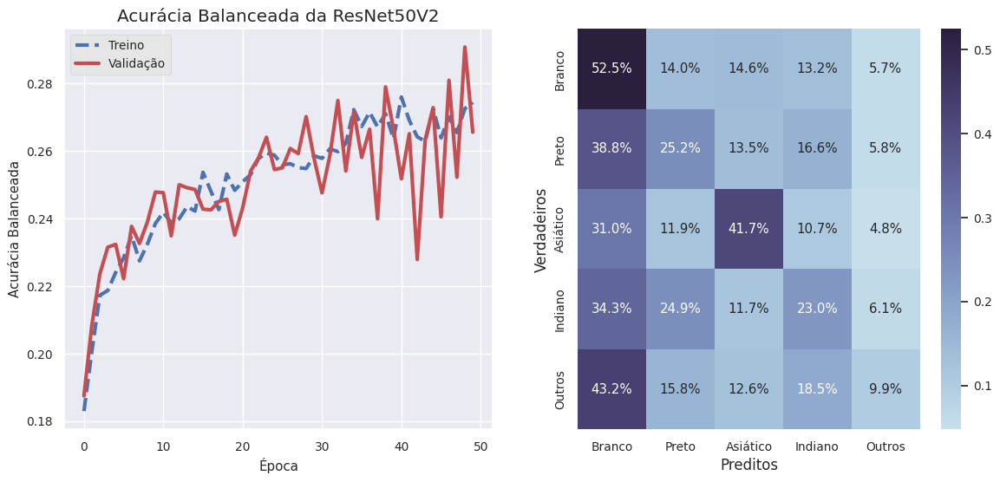

In [ ]:
class_labels = {'race': ['Branco', 'Preto', 'Asiático', 'Indiano', 'Outros'], 'gender': ['Masculino', 'Feminino']}

plot_mae_history('age', 'ResNet50V2', predictions_resnet_multioutput[0], y_val, multioutput=True)
plot_accuracy_history('gender', predictions_resnet_multioutput[1], 'ResNet50V2', df_val, y_val, class_labels['gender'], multioutput=True)
plot_accuracy_history('race', predictions_resnet_multioutput[2], 'ResNet50V2', df_val, y_val, class_labels['race'], multioutput=True)

## Final Model

In [ ]:
import numpy as np
from sklearn.utils import class_weight
from keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from keras.applications.resnet_v2 import preprocess_input as preprocess_input_resnet

baseline_epochs = 50
baseline_batch_size = 32

#### Pré-Processamento

In [ ]:
# Compute class weights for gender
gender_weights = class_weight.compute_class_weight('balanced', classes=np.unique(df_train['gender']), y=df_train['gender'])
gender_weights = dict(enumerate(gender_weights))

# Compute class weights for race
race_weights = class_weight.compute_class_weight('balanced', classes=np.unique(df_train['race']), y=df_train['race'])
race_weights = dict(enumerate(race_weights))

In [ ]:
# Baseline ResNet50V2
backbone = tf.keras.applications.resnet_v2.ResNet50V2(include_top=False, input_shape=(224, 224, 3), pooling='avg')

for layer in backbone.layers:
  layer.trainable = False

# Add a Dense layer 1
x = Dense(256, activation='relu')(backbone.output)

# Add a Dense layer 2
x = Dense(128, activation='relu')(x)

# Define separate output layers for age, gender, and race
age_output = Dense(1, name='age_output')(x)
gender_output = Dense(1, activation='sigmoid', name='gender_output')(x)
race_output = Dense(5, activation='softmax', name='race_output')(x)

# Combine the outputs into a single model
model = tf.keras.Model(inputs=backbone.input, outputs=[age_output, gender_output, race_output])

# Compile the model with appropriate loss functions and metrics
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss={'age_output': 'mae', 'gender_output': BinaryCrossentropyScratch, 'race_output': CategoricalCrossentropyScratch},
              metrics={'age_output': ['mae'], 'gender_output': [BalancedBinaryAccuracy()], 'race_output': [BalancedSparseCategoricalAccuracy()]})

# Fit the model
history = model.fit(train_generator, epochs=baseline_epochs, validation_data=val_generator, batch_size=baseline_batch_size)

# Save the model
model.save(os.path.join(base_dir, 'Modelos/trab_final_multioutput_finalmodel_ResNet50V2.keras'))

# Save the history
with open(os.path.join(base_dir, 'Modelos/trab_final_multioutput_finalmodel_ResNet50V2_history.json'), 'w') as f:
    json.dump(history.history, f)

Epoch 1/50
475/475 [==============================] - ETA: 0s - loss: -429.4387 - age_output_loss: 18.9355 - gender_output_loss: -449.8796 - race_output_loss: 1.5053 - age_output_mae: 18.9355 - gender_output_balanced_binary_accuracy: 0.5000 - race_output_balanced_sparse_categorical_accuracy: 0.0208

KeyboardInterrupt: ignored

## Exemplos de imagens que erramos em cada um dos modelos ResNet e em comum nos três

In [ ]:
def display_images(true_labels, predicted, df, category, figsize=(18, 18), classes=None):
    if not classes:
      classes = np.unique(true_labels)
    num_classes = len(classes)
    fig, axes = plt.subplots(num_classes, num_classes, figsize=figsize)

    for i, true_class in enumerate(classes):
        true_indices = np.where(true_labels == true_class)[0]
        for j, pred_class in enumerate(classes):
            pred_indices = np.where(predicted == pred_class)[0]
            common_indices = np.intersect1d(true_indices, pred_indices)

            if len(common_indices) > 0:
                image_index = common_indices[0]  # Picking the first matching index
                img = Image.open(os.path.join(base_dir_images, df.iloc[image_index]['filename']))
                axes[i, j].imshow(img)
                if category in('race', 'gender'):
                  axes[i, j].set_title(f"Pred: {labels_mapping_full[category][j]}, True: {labels_mapping_full[category][i]}\n idx={image_index}")
                else:
                  axes[i, j].set_title(f"Pred: {pred_class}, True: {true_class}\n idx={image_index}")
                axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
predicted_classes_race = np.argmax(predictions_resnet_race, axis=1)

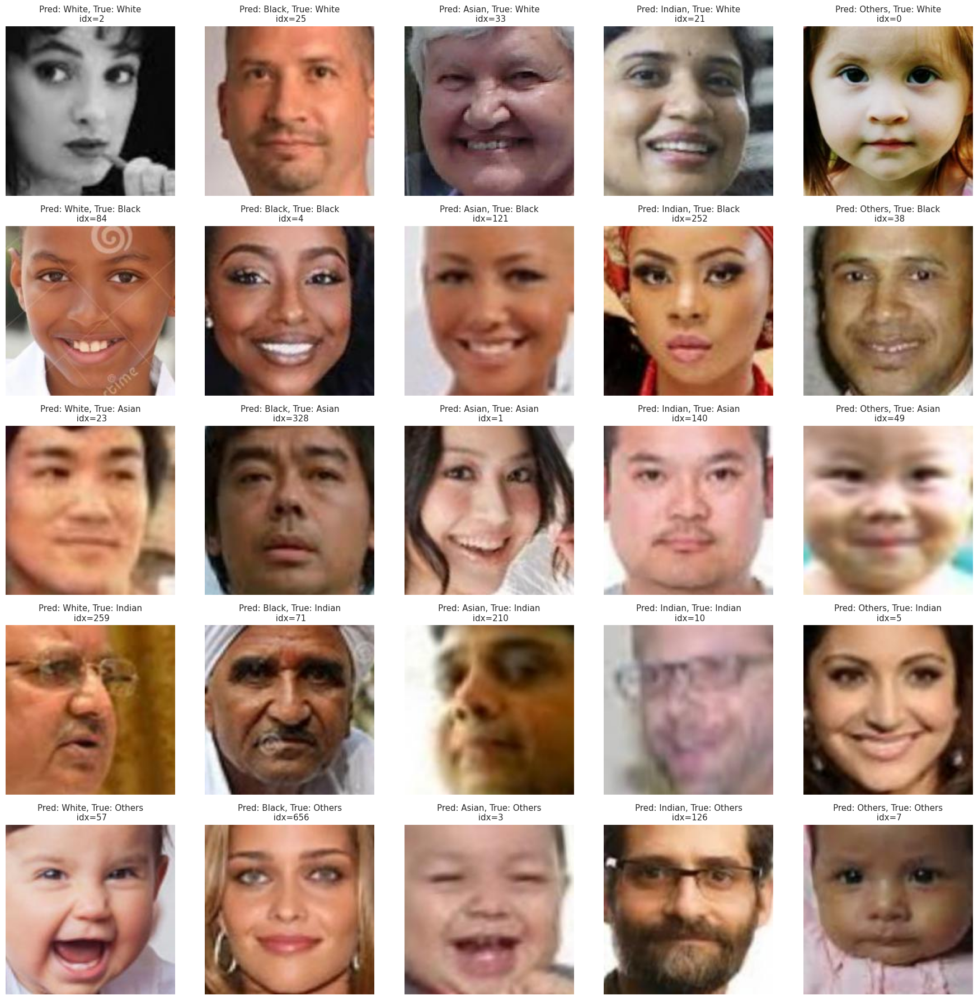

In [ ]:
display_images(y_val['race'], predicted_classes_race, df_val, 'race')

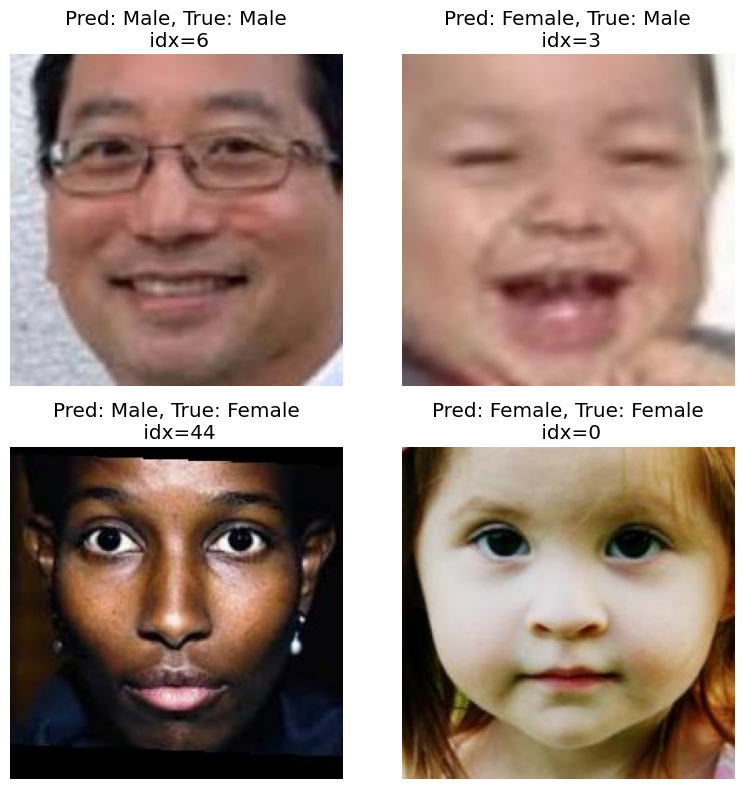

In [ ]:
display_images(y_val['gender'], predictions_resnet_gender, df_val, 'gender', figsize=(8, 8))

In [ ]:
indices_negativos = np.where(predictions_resnet_age < 0)[0]
valores_negativos = predictions_resnet_age[indices_negativos]

valores_negativos_ordenados = np.sort(valores_negativos, axis=0)

print("Quantidade negativos:", len(indices_negativos))
print("Percentual negativos:", '{:.2%}'.format(len(indices_negativos)/ len(predictions_resnet_age)))
print("Menor valor negativo:", valores_negativos_ordenados[0])

Quantidade negativos: 94
Percentual negativos: 2.48%
Menor valor negativo: [-18.]


In [ ]:
true_bins, pred_bins = get_categorical_pred(predictions_resnet_age, y_val, category='age')
true_bins_str = true_bins.astype(str)
pred_bins_str = pred_bins.astype(str)

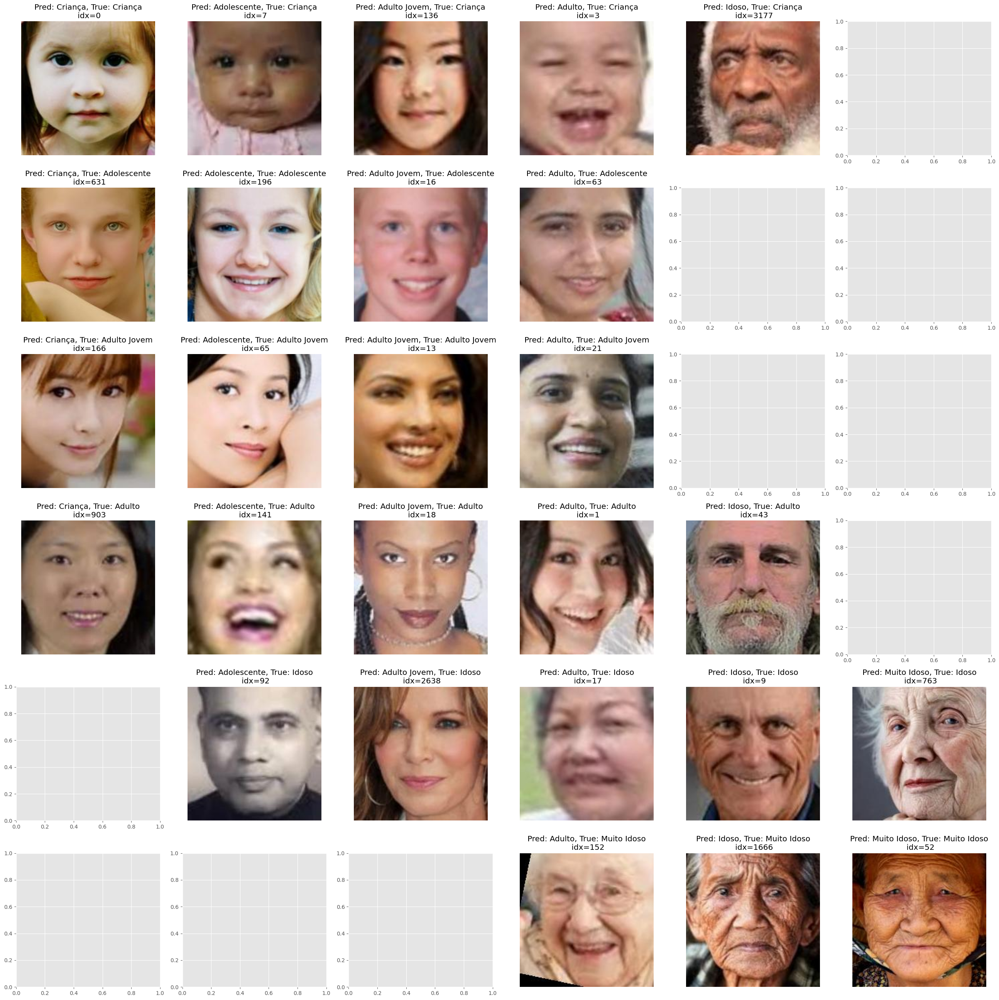

In [ ]:
display_images(pd.Categorical(true_bins_str), pred_bins_str, df_val, 'age', figsize=(26,26), classes = ['Criança', 'Adolescente', 'Adulto Jovem', 'Adulto', 'Idoso', 'Muito Idoso'])

In [ ]:
df_val.iloc[3177]
#label de idade beeeem errada, predição correta

age                                               5
gender                                            0
race                                              1
filename       5_0_1_20170117193745507.jpg.chip.jpg
race_desc                                     Black
gender_desc                                       M
Name: 3178, dtype: object

In [ ]:
df_val.iloc[43]

age                                               55
gender                                             0
race                                               0
filename       55_0_0_20170120223715854.jpg.chip.jpg
race_desc                                      White
gender_desc                                        M
Name: 43, dtype: object

In [ ]:
# TODO: erros em comuns e acertos em comuns

## Resultados na base de teste (In Progress)

In [ ]:
# Preprocessing for ResNet50V2
generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=pad_and_preprocess_image_resnet)

test_generator = generator.flow_from_dataframe(
        df_test, directory=base_dir_images, x_col='filename', y_col=['race'], image_size=(224, 224),
        target_size=(224, 224), class_mode='raw', batch_size=race_baseline_batch_size, shuffle=False)

Found 4742 validated image filenames.


In [ ]:
tf.keras.utils.get_custom_objects()['BalancedSparseCategoricalAccuracy'] = BalancedSparseCategoricalAccuracy
model = tf.keras.models.load_model(os.path.join(base_dir,'Modelos/trab_final_race_baseline_ResNet50V2.keras'))
predictions = model.predict(test_generator)

In [ ]:
from sklearn.metrics import balanced_accuracy_score, classification_report, log_loss

predicted_classes = np.argmax(predictions, axis=1)
balanced_acc_test = balanced_accuracy_score(y_test["race"], predicted_classes)
loss_test = log_loss(y_test["race"], predictions)

report = classification_report(predicted_classes, df_test["race"])
print("\n\nRelatório de classificação:")
print(report)

print(f"Acurácia balanceada em Teste: {balanced_acc_test}")
print(f"Loss em Teste: {loss_test}")



Relatório de classificação:
              precision    recall  f1-score   support

           0       0.68      0.85      0.75      1551
           1       0.76      0.76      0.76       923
           2       0.72      0.66      0.69       755
           3       0.57      0.60      0.58       788
           4       0.45      0.20      0.28       725

    accuracy                           0.66      4742
   macro avg       0.63      0.62      0.61      4742
weighted avg       0.65      0.66      0.64      4742

Acurácia balanceada em Teste: 0.6333148817936044
Loss em Teste: 0.920618178197938




Matriz de confusão relativa


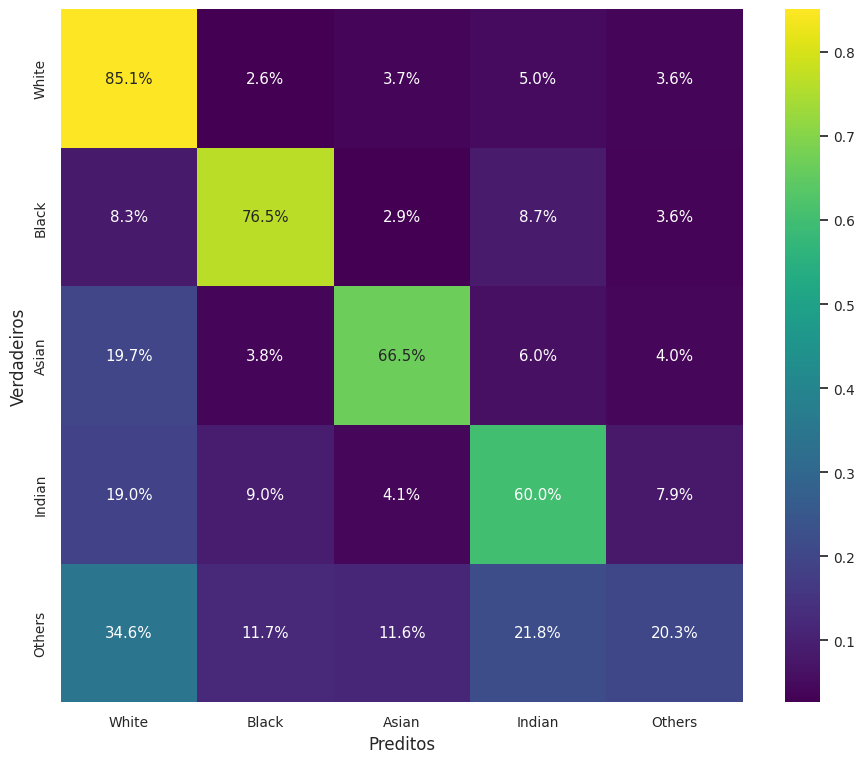

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Matriz de confusão relativa
cfm = confusion_matrix(np.argmax(predictions, axis=1), df_test["race"])
cmn = cfm / cfm.astype(float).sum(axis=1, keepdims=True)

class_labels = ['White', 'Black', 'Asian', 'Indian', 'Others']

print("\n\nMatriz de confusão relativa")
plt.figure(figsize = (11,9))
sns.set(font_scale=0.9)
heatmap = sns.heatmap(cmn, annot=True, fmt='.1%', cmap='viridis', xticklabels=class_labels, yticklabels=class_labels)

heatmap.set_xlabel('Preditos', fontsize=12)
heatmap.set_ylabel('Verdadeiros', fontsize=12)

plt.show()